In [1]:
import sys
sys.path.append("../input/pretrained-models-pytorch")
sys.path.append("../input/efficientnet-pytorch")
sys.path.append("/kaggle/input/smp-github/segmentation_models.pytorch-master")
sys.path.append("/kaggle/input/timm-pretrained-resnest/resnest/")
sys.path.append("/kaggle/input/contrails-helper")

<!-- Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/gluon_resnest26-50eb607c.pth" to /root/.cache/torch/hub/checkpoints/gluon_resnest26-50eb607c.pth -->

In [2]:
!mkdir -p /root/.cache/torch/hub/checkpoints/
!cp /kaggle/input/contrails-helper/efficientnet-b4-6ed6700e.pth /root/.cache/torch/hub/checkpoints/efficientnet-b4-6ed6700e.pth


In [3]:
import torch
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
from torch.optim.lr_scheduler import CosineAnnealingLR, ReduceLROnPlateau
from torch.optim import AdamW
import torch.nn as nn
from torchmetrics.functional import dice
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
from IPython.display import display
import os

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from torch_train import TorchTrain
import segmentation_models_pytorch as smp

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [4]:
BASE_DIR = "/kaggle/input/google-research-identify-contrails-reduce-global-warming"
DEVICE = TorchTrain.DEVICE

In [5]:
metadata = pd.read_csv("/kaggle/input/contrails-helper/metadata.csv")
train_md = metadata[metadata["Split"] == "train"]
validation_md = metadata[metadata["Split"] == "validation"]
display(train_md.head())
display(validation_md.head())

,Record_ID,Split,Contrails,High_Pixels
0,1000216489776414077,train,False,0.000000
1,1000603527582775543,train,True,8.512878
2,1000660467359258186,train,True,1.028442
3,100071707854144929,train,False,0.000000
4,1000823728928031783,train,True,0.563049


,Record_ID,Split,Contrails,High_Pixels
20529,1000834164244036115,validation,False,0.000000
20530,1002653297254493116,validation,False,0.000000
20531,1002777035567823518,validation,True,0.038147
20532,1010397530434035516,validation,False,0.000000
20533,1012978360687713914,validation,False,0.000000


In [6]:
_T11_BOUNDS = (243, 303)
_CLOUD_TOP_TDIFF_BOUNDS = (-4, 5)
_TDIFF_BOUNDS = (-4, 2)
N_TIMES_BEFORE = 4
IMG_SIZE = 256
BATCH_SIZE = 16

def normalize_range(data, bounds):
    """Maps data to the range [0, 1]."""
    return (data - bounds[0]) / (bounds[1] - bounds[0])

def load_one_record(record_id, BASE_DIR=BASE_DIR, mask_too=True):
    band11 = np.load(f"{BASE_DIR}/{str(record_id)}/band_11.npy")
    band14 = np.load(f"{BASE_DIR}/{str(record_id)}/band_14.npy")
    band15 = np.load(f"{BASE_DIR}/{str(record_id)}/band_15.npy")
    if mask_too:
        human_pixel_mask =  np.load(f"{BASE_DIR}/{str(record_id)}/human_pixel_masks.npy")
        
    r = normalize_range(band15 - band14, _TDIFF_BOUNDS)
    g = normalize_range(band14 - band11, _CLOUD_TOP_TDIFF_BOUNDS)
    b = normalize_range(band14, _T11_BOUNDS)
    false_color = np.clip(np.stack([r, g, b], axis=2), 0, 1)
    
    img = false_color[..., N_TIMES_BEFORE]
    if mask_too:
        return img, human_pixel_mask
    else:
        return img

In [7]:
class ContrailsDataLoader():
    def __init__(self, df, split="train"):
        self.df = df
        self.split = split
        self.normalize_image = transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
        
    def __getitem__(self, idx):
        record_id = self.df.iloc[idx]["Record_ID"]
        images, mask = load_one_record(record_id, f"{BASE_DIR}/{self.split}")
        images = torch.tensor(np.reshape(images, (256, 256, 3))).to(torch.float32).permute(2, 0, 1)
        images = self.normalize_image(images)
        mask = mask.transpose(2, 0, 1)
        return images.float(), torch.from_numpy(mask).float()

    def __len__(self):
        return len(self.df)
    
class ContrailsDataLoaderTest():
    def __init__(self, ids, split="test"):
        self.ids = ids
        self.split = split
        self.normalize_image = transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
        
    def __getitem__(self, idx):
        record_id = self.ids[idx]
        images = load_one_record(record_id, f"{BASE_DIR}/{self.split}", mask_too=False)
        images = torch.tensor(np.reshape(images, (256, 256, 3))).to(torch.float32).permute(2, 0, 1)
        images = self.normalize_image(images)
        return images.float(), record_id

    def __len__(self):
        return len(self.ids)

In [8]:
train_dataloader = ContrailsDataLoader(train_md, "train")
validation_dataloader = ContrailsDataLoader(validation_md, "validation")

train_data = DataLoader(train_dataloader, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
validation_data = DataLoader(validation_dataloader, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)


In [9]:
for image, label in train_data:
    print(image.shape, label.shape)
    break

torch.Size([16, 3, 256, 256]) torch.Size([16, 1, 256, 256])


In [10]:
for image, label in validation_data:
    print(image.shape, label.shape)
    break

torch.Size([16, 3, 256, 256]) torch.Size([16, 1, 256, 256])


In [11]:
test_ids = os.listdir(f"{BASE_DIR}/test")
test_dataloader = ContrailsDataLoaderTest(test_ids, "test")
test_data = DataLoader(test_dataloader, batch_size=10, shuffle=False, num_workers=2)
for image, img_id in test_data:
    print(image.shape, img_id)
    break

torch.Size([2, 3, 256, 256]) ('1002653297254493116', '1000834164244036115')


In [12]:
unet = smp.Unet(
     encoder_name='efficientnet-b4',
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation=None,
    )

In [13]:
class Dice(nn.Module):
    def __init__(self, use_sigmoid=True):
        super(Dice, self).__init__()
        self.sigmoid = nn.Sigmoid()
        self.use_sigmoid = use_sigmoid

    def forward(self, inputs, targets, smooth=1):
        if self.use_sigmoid:
            inputs = self.sigmoid(inputs)       
        
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()
        dice = (2.0 *intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        
        return dice
    
dice = Dice()

In [14]:
unet.to(DEVICE)
optimizer = torch.optim.Adam(unet.parameters(), lr=0.001)
loss_fn = nn.BCEWithLogitsLoss(pos_weight=torch.tensor(100))
metrics = {
    "dice": dice,
}
tt = TorchTrain(unet, optimizer, loss_fn, metrics = metrics)
history = tt.fit(train_data, validation_data, verbose = True, epochs = 5)

Epoch  1/ 5 Batch 1284/1284[====================] Train loss: 0.1991 | Train Dice: 0.1446
Epoch    1/   5[========------------] Test loss: 0.0895 | Test Dice: 0.1217
Epoch  2/ 5 Batch 1284/1284[====================] Train loss: 0.1445 | Train Dice: 0.1876
Epoch    2/   5[============--------] Test loss: 0.1070 | Test Dice: 0.0829
Epoch  3/ 5 Batch 1284/1284[====================] Train loss: 0.1225 | Train Dice: 0.2177
Epoch    3/   5[================----] Test loss: 0.0940 | Test Dice: 0.0729
Epoch  4/ 5 Batch 1284/1284[====================] Train loss: 0.1192 | Train Dice: 0.2193
Epoch    4/   5[====================] Test loss: 0.0806 | Test Dice: 0.1651
Epoch  5/ 5 Batch 1284/1284[====================] Train loss: 0.1031 | Train Dice: 0.2487
Epoch    5/   5[========================] Test loss: 0.0740 | Test Dice: 0.1608


In [15]:
unet.eval();

In [16]:
def visualize_results(record_id, split="validation", thresh = 0.5):
    data_dir = f"{BASE_DIR}/{split}"
    img, mask = load_one_record(record_id, data_dir)
    pred = unet(torch.from_numpy(img.transpose(2, 0, 1)).float().unsqueeze(0).to(DEVICE))
    pred = torch.nn.functional.sigmoid(pred)
    pred = pred.squeeze(0).cpu().detach().numpy()
    pred = pred.transpose(1, 2, 0)
    pred_thresh = (pred>thresh).astype(int)
    
    plt.figure(figsize = (15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title("Ash Image")
    
    plt.subplot(1, 3, 2)
    plt.imshow(mask)
    plt.title("Ground Truth")
    
    plt.subplot(1, 3, 3)
    plt.imshow(pred_thresh)
    plt.title("Prediction")


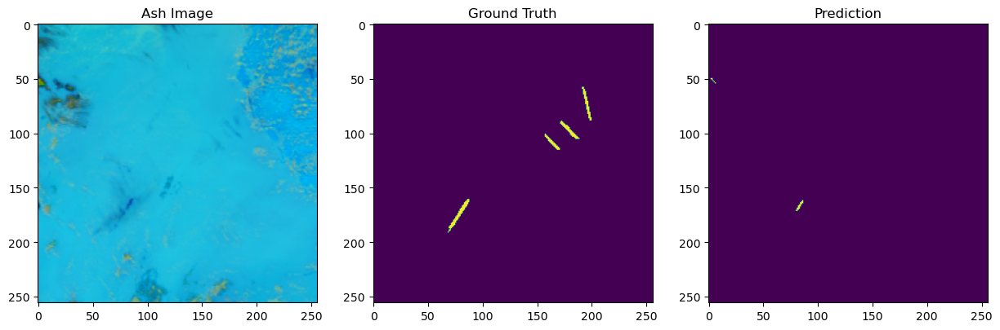

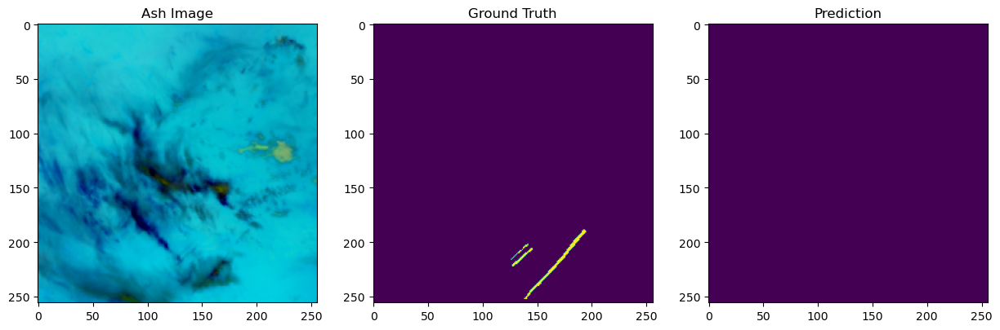

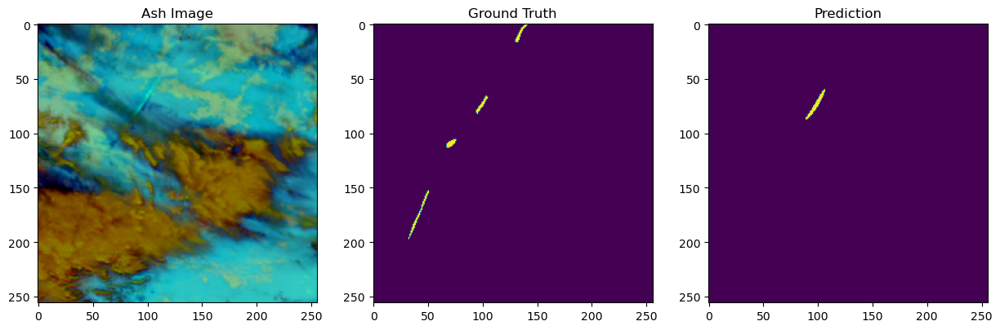

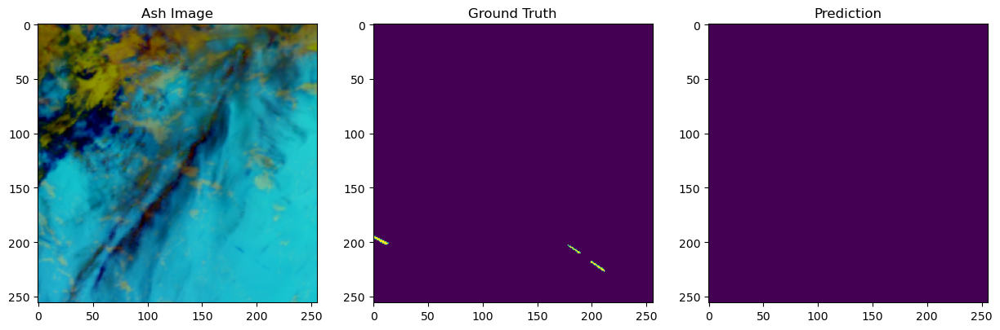

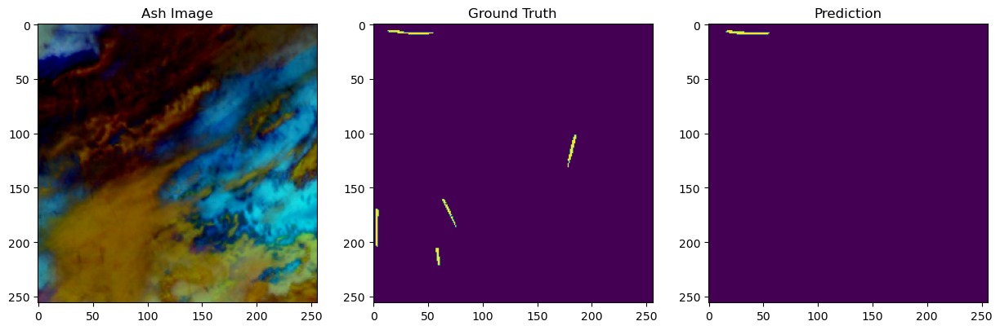

...

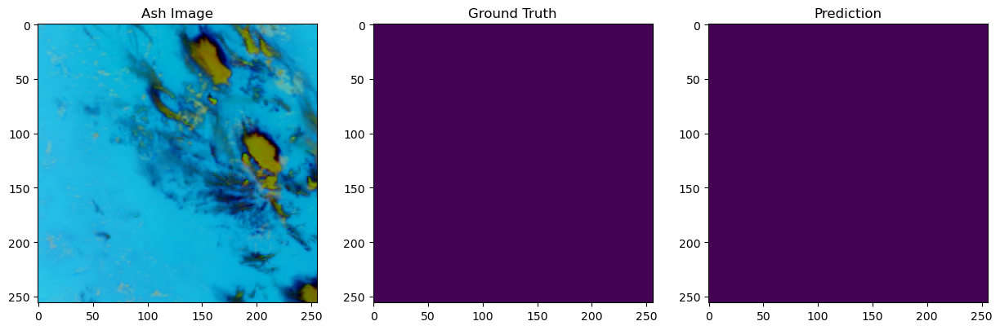

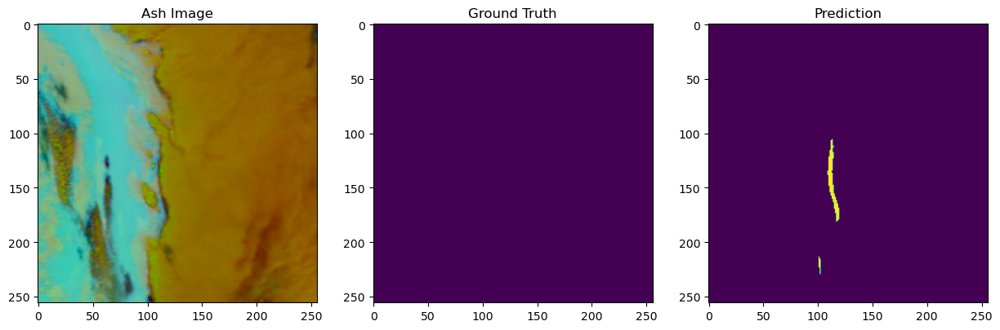

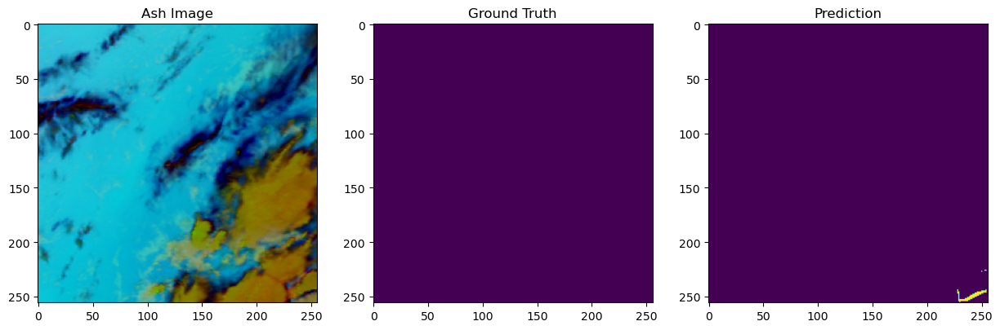

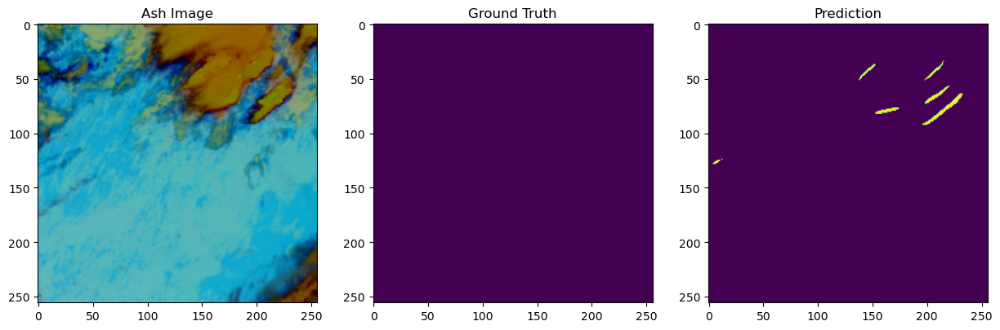

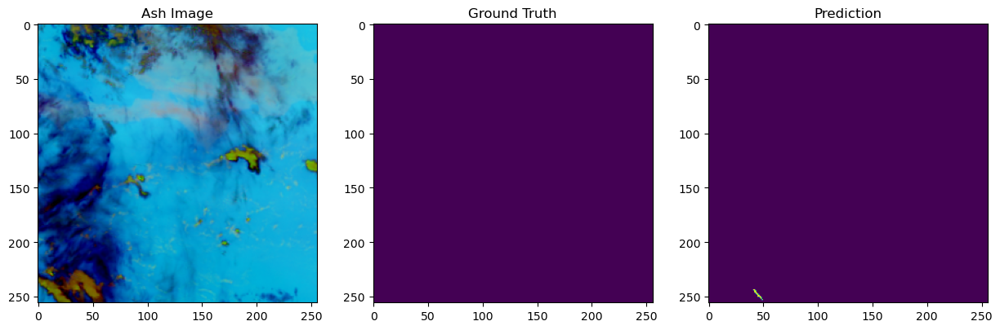

In [17]:
pos_validation = validation_md[validation_md["Contrails"] == True].sample(10)["Record_ID"]
neg_validation = validation_md[validation_md["Contrails"] == False].sample(10)["Record_ID"]
for record_id in pos_validation:
    visualize_results(record_id, thresh = 0.9, split="validation")
for record_id in neg_validation:
    visualize_results(record_id, thresh = 0.9, split="validation")

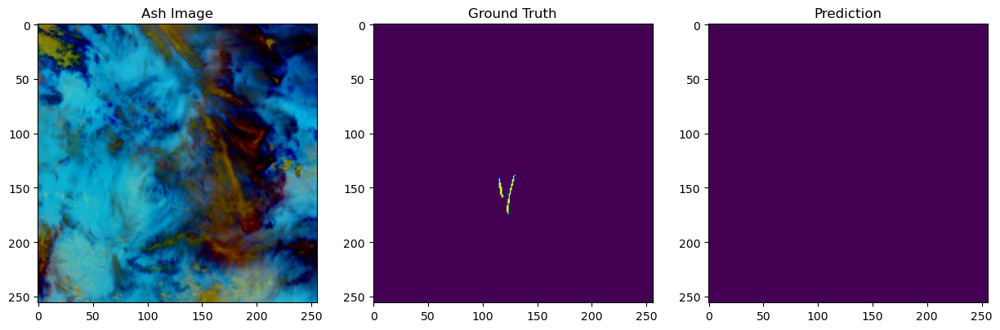

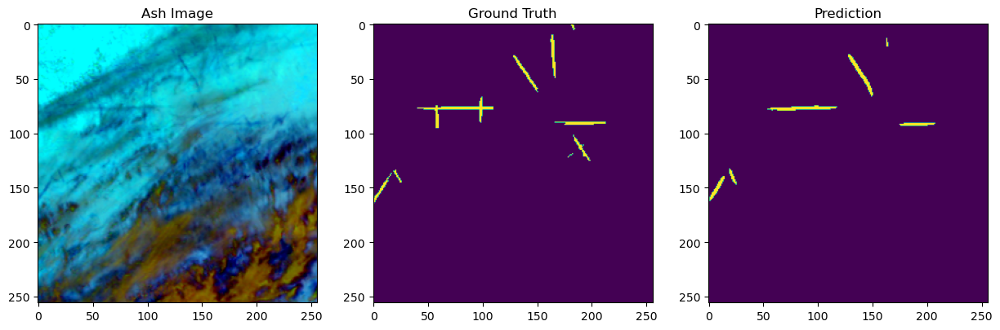

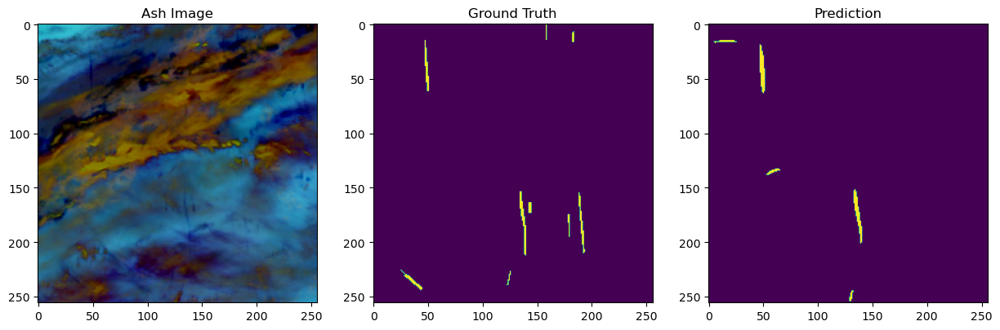

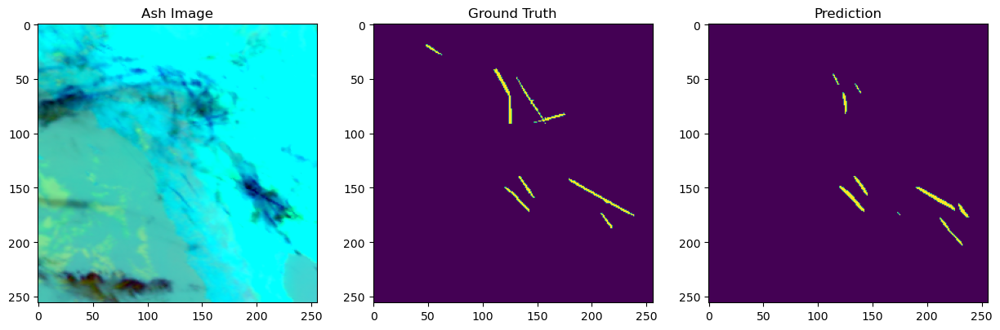

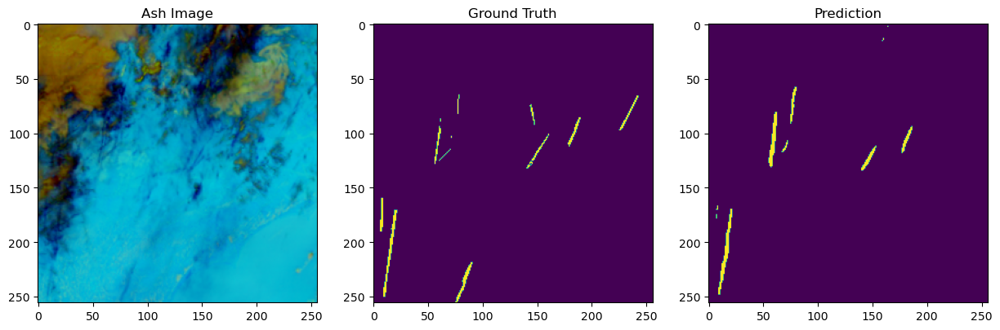

...

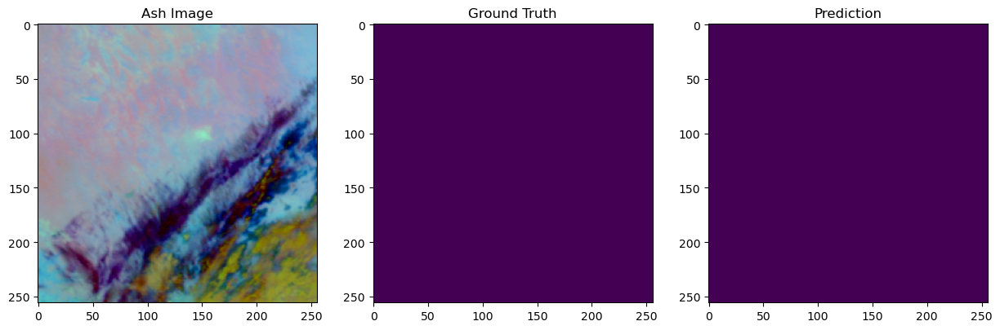

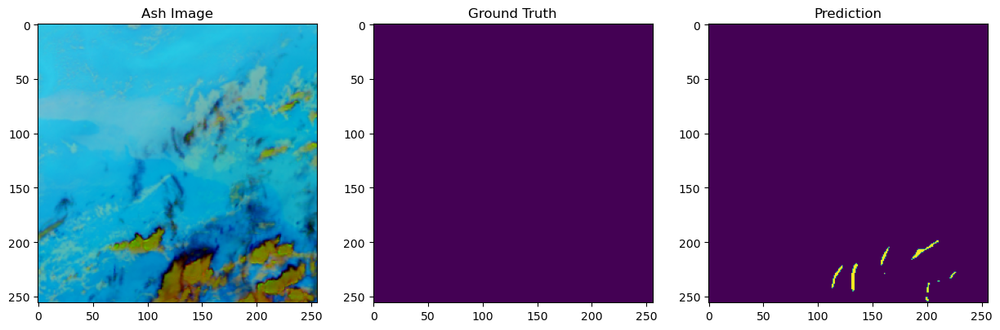

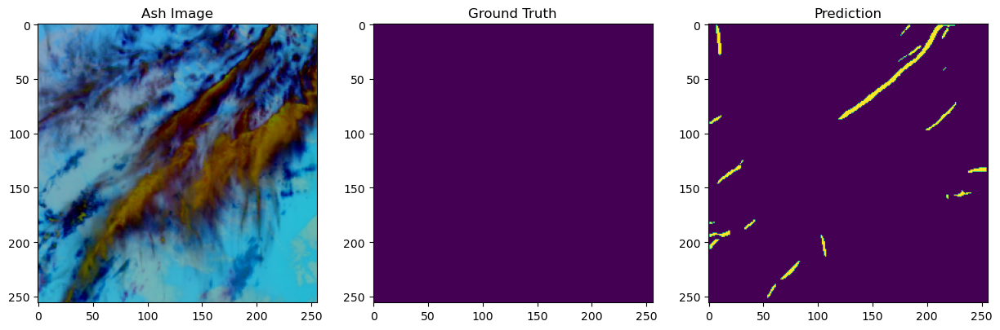

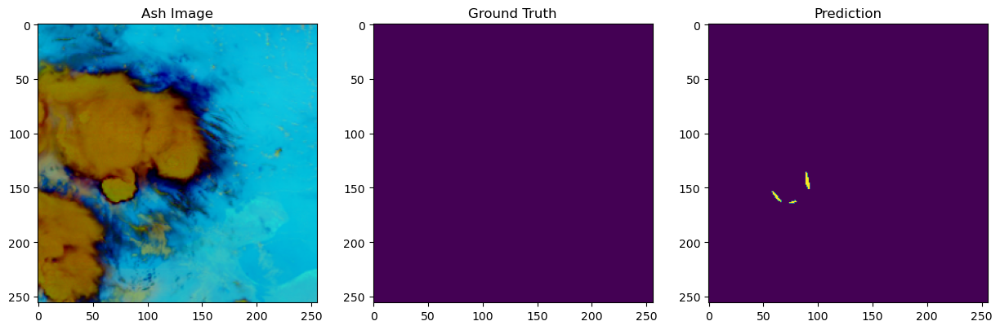

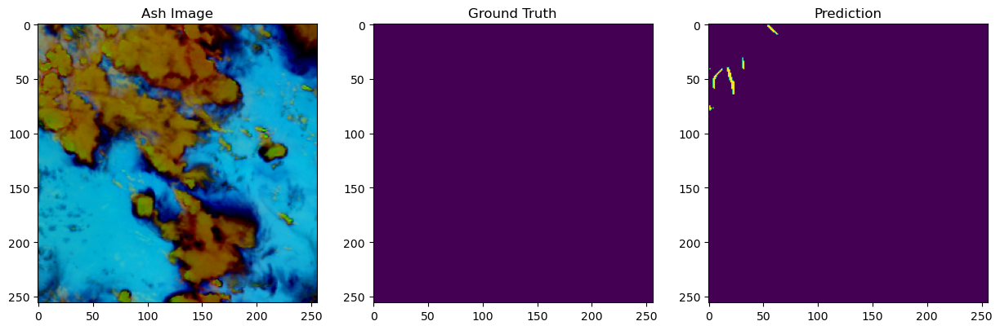

In [18]:
pos_train = train_md[train_md["Contrails"] == True].sample(10)["Record_ID"]
neg_train = train_md[train_md["Contrails"] == False].sample(10)["Record_ID"]
for record_id in pos_train:
    visualize_results(record_id, thresh = 0.9, split="train")
for record_id in neg_train:
    visualize_results(record_id, thresh = 0.9, split="train")

In [19]:
def rle_encode(x, fg_val=1):
    """
    Args:
        x:  numpy array of shape (height, width), 1 - mask, 0 - background
    Returns: run length encoding as list
    """

    dots = np.where(
        x.T.flatten() == fg_val)[0]  # .T sets Fortran order down-then-right
    run_lengths = []
    prev = -2
    for b in dots:
        if b > prev + 1:
            run_lengths.extend((b + 1, 0))
        run_lengths[-1] += 1
        prev = b
    return run_lengths

def list_to_string(x):
    """
    Converts list to a string representation
    Empty list returns '-'
    """
    if x: # non-empty list
        s = str(x).replace("[", "").replace("]", "").replace(",", "")
    else:
        s = '-'
    return s

In [20]:
submission = pd.read_csv('/kaggle/input/google-research-identify-contrails-reduce-global-warming/sample_submission.csv', index_col='record_id')
THRESHOLD = 0.9
for i, data in enumerate(test_data):
    images, image_id = data
    
    # Predict mask for this instance
    images = images.to(DEVICE)
    predicated_mask = unet(images)
    predicated_mask = torch.sigmoid(predicated_mask).cpu().detach().numpy()
    
    # Apply threshold
    predicated_mask_with_threshold = np.zeros((images.shape[0], 256, 256))
    predicated_mask_with_threshold[predicated_mask[:, 0, :, :] < THRESHOLD] = 0
    predicated_mask_with_threshold[predicated_mask[:, 0, :, :] > THRESHOLD] = 1
    
    for img_num in range(0, images.shape[0]):
        current_mask = predicated_mask_with_threshold[img_num, :, :]
        current_image_id = image_id[img_num]
        
        submission.loc[int(current_image_id), 'encoded_pixels'] = list_to_string(rle_encode(current_mask))


In [21]:
submission

,encoded_pixels
record_id,
1000834164244036115,41480 2 41737 3 41995 2 42254 1 42511 2
1002653297254493116,34938 6 37014 5 37272 7 37531 6 37790 6 38050 4


In [22]:
submission.to_csv('submission.csv')